## Chapter 4: Modern Model Estimation - Gibbs Sampling

In [1]:
import pandas as pd
import numpy as np

from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf

import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

---

In [2]:
xs = np.arange(0,100000,10)
trace = go.Scatter(x=xs, 
                   y=np.array([np.mean(np.random.beta(a=1498, b=1519, size=ss)) for ss in xs[1:1000]]), 
                   mode='lines',
                   line=dict(width=1.5),
                   name='Estimated Mean of Sample',
                  )
data = [trace]

layout = {
    'shapes': [
        # Line Horizontal
        {
            'type': 'line',
            'x0': 0,
            'y0': 1498/(1498+1519),
            'x1': 10000,
            'y1': 1498/(1498+1519),
            'line': {
                'width': 1,
#                 'dash': 'dash'
            },
        },
        {
            'type': 'line',
            'x0': 0,
            'y0': 1498/(1498+1519)-0.0005,
            'x1': 10000,
            'y1': 1498/(1498+1519)-0.0005,
            'line': {
                'width': 1,
                'dash': 'dot'
            },
        },
        {
            'type': 'line',
            'x0': 0,
            'y0': 1498/(1498+1519)+0.0005,
            'x1': 10000,
            'y1': 1498/(1498+1519)+0.0005,
            'line': {
                'width': 1,
                'dash': 'dot'
            },
        }
    ]
}

fig = {'data': data, 'layout': layout}
iplot(fig, show_link=False)

---
#### The Inversion Method

In [3]:
U = np.random.uniform(size=10000)
Z = stats.norm.ppf(U)

In [4]:
trace = go.Histogram(x = Z)
iplot([trace], show_link=False)

In [5]:
# Kolmogorov-Smirnov Test
stats.kstest(Z, 'norm')

KstestResult(statistic=0.012276293655457127, pvalue=0.0981636960266011)

---
#### Rejection Sampling (vectorized)

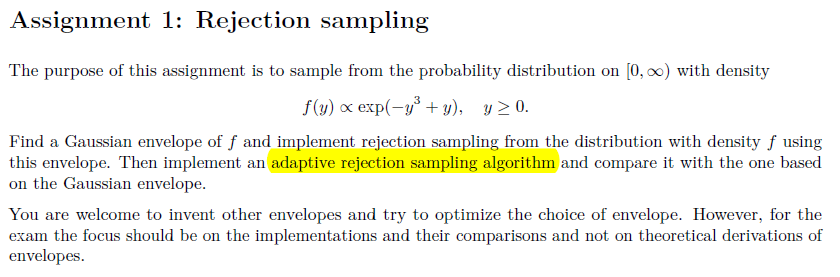

In [6]:
# Set g(x) parameters
c = 0.55
mu = 1/np.sqrt(3)
sigma = 0.4
k = 0.63427

In [7]:
def draw_N(n):
    Y = np.random.normal(loc=mu, scale=sigma, size=n)  # draw from g(x)
    u = np.random.uniform(size=n)
    R = u*stats.norm.pdf(Y, loc = mu, scale = sigma)/c < k*np.exp(-Y**3+Y)
    return Y[(Y >= 0) & R]

In [8]:
def draw_Nn(n, acc):
    x = np.zeros(n)
    l = 0    # insertion position
    k = n-l
    i = 0
    while (k > 0):
        lot = draw_N(10**i * int(k/acc))
        x[l:min(k,len(lot))+l] = lot[:min(k,len(lot))]
        l += len(lot)
        k = n-l
        i += 1
    return x

In [9]:
%%timeit
draw_Nn(100000, len(draw_N(1000))/1000)

89.2 ms ± 12.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [10]:
xs = np.linspace(0,3,1000)

trace1 = go.Scatter(x = xs,
                    y = stats.norm.pdf(xs, loc = mu, scale = sigma)/c,
                    mode = 'lines',
                    line = dict(shape = 'spline'),
                    name = 'Envelope'
                   )
trace2 = go.Scatter(x = xs,
                    y = k*np.exp(-xs**3+xs),
                    mode = 'lines',
                    line = dict(shape = 'spline'),
                    name = 'Target'
                   )
hist = go.Histogram(x = draw_Nn(100000, len(draw_N(1000))/1000),
                    opacity = 0.85,
                    histnorm = 'probability density',
                    name = 'Draws'
                   )

iplot([trace1, trace2, hist], show_link=False)

---
### Gibbs Sampling

In [11]:
np.random.uniform()

0.33046404329294066

In [12]:
np.random.uniform()

0.8893179396303027

In [13]:
# Gibbs Sampling using inversion method
def Gibbs1(n = 2000):
    x, y = np.full(shape=(2,n), fill_value=-5, dtype=float)
    for i in range(1,n):
        # Sample from x|y 
        u = np.random.uniform()
        x[i] = np.sqrt(u*(6*y[i-1]+8) + (1.5*y[i-1]+1)**2) - (1.5*y[i-1]+1)
        
        # Sample from x|y 
        u = np.random.uniform()
        y[i] = np.sqrt((2*u*(4*x[i]+10))/3 + ((2*x[i]+2)/3)**2) - (2*x[i]+2)/3
        
    return x, y

In [14]:
X, Y = Gibbs1()

In [15]:
X_trace = go.Histogram(x = X,
                 opacity = 0.8,
                 xbins=dict(start = 0,
                            end = 2,
                            size = 0.01))
Y_trace = go.Histogram(x = Y,
                 opacity = 0.8,
                 xbins=dict(start = 0,
                            end = 2,
                            size = 0.01))
layout = go.Layout(
    barmode='overlay',
    xaxis=dict(
        range=[0, 2]
    ),
)
fig = {'data': [X_trace, Y_trace], 'layout': layout}
iplot(fig, show_link=False)

In [16]:
xs = np.arange(2000)
X_trace = go.Scatter(x = xs,
                     y = X,
                     mode = 'lines',
                    name='X')
Y_trace = go.Scatter(x = xs,
                     y = Y,
                     mode = 'lines',
                    name='Y')
fig = {'data': [X_trace, Y_trace]}
iplot(fig, show_link=False)

---

In [17]:
from plotly import tools

In [18]:
xs = np.arange(2000)
trace1 = go.Scatter(x = xs,
                    y = X,
                    name = 'Trace'
)
trace2 = go.Histogram(x = X,
                      xbins=dict(start = 0,
                                 end = 2,
                                 size = 0.05
                                ),
                      name = 'Posterior Density'
)

fig = tools.make_subplots(rows=2, cols=1)

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)

fig['layout'].update(    
    yaxis=dict(
        domain=[0, 0.3]
    ),
    yaxis2=dict(
        domain=[0.4, 1],
    ),
    xaxis2 = dict(
        range=[-0.3, 2.5]
    )
)
iplot(fig, show_link=False)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x2,y2 ]



In [19]:
trace = go.Scatter(x = X, y = Y, mode = 'lines')
iplot([trace], show_link=False)

---

In [20]:
# Gibbs Sampling using rejection sampling
def Gibbs2(n = 2000):
    x, y = np.full(shape=(2,n), fill_value=-1, dtype=float)
    for i in range(1,n):
        # Sample from x|y using rejection sampling
        checkpoint = True
        while checkpoint:
            u = np.random.uniform(high=2)
            if (2*u+3*y[i-1]+2 > 25*np.random.uniform()*0.5):
                x[i] = u
                break
                
        # Sample from y|x using rejection sampling
        checkpoint = True
        while checkpoint:
            u = np.random.uniform(high=2)
            if (2*x[i]+3*u+2 > 25*np.random.uniform()*0.5):
                y[i] = u
                break
    return x, y

In [21]:
X, Y = Gibbs2()

In [22]:
X_trace = go.Histogram(x = X,
                 opacity = 0.8,
                 xbins=dict(start = 0,
                            end = 2,
                            size = 0.01))
Y_trace = go.Histogram(x = Y,
                 opacity = 0.8,
                 xbins=dict(start = 0,
                            end = 2,
                            size = 0.01))
layout = go.Layout(
    barmode='overlay',
    xaxis=dict(
        range=[0, 2]
    ),
)
fig = {'data': [X_trace, Y_trace], 'layout': layout}
iplot(fig, show_link=False)

In [23]:
xs = np.arange(2000)
X_trace = go.Scatter(x = xs,
                     y = X,
                     mode = 'lines',
                    name='X')
Y_trace = go.Scatter(x = xs,
                     y = Y,
                     mode = 'lines',
                    name='Y')
fig = {'data': [X_trace, Y_trace]}
iplot(fig, show_link=False)

In [24]:
trace = go.Scatter(x = X, y = Y, mode = 'lines')
iplot([trace], show_link=False)

---

In [25]:
# Gibbs Sampling from a bivariate normal pdf
def Gibbs3(n = 2000):
    x, y = np.full(shape=(2,n), fill_value=-10, dtype=float)
    for i in range(1,n):
        # Sample from x|y
        x[i] = np.random.normal(loc=0.5*y[i-1], scale=np.sqrt(1-0.5**2))
                
        # Sample from y|x
        y[i] = np.random.normal(loc=0.5*x[i], scale=np.sqrt(1-0.5**2))
            
    return x, y

In [26]:
X, Y = Gibbs3()

In [27]:
X_trace = go.Histogram(x = X[500:],
                 opacity = 0.8,
#                  xbins=dict(start = 0,
#                             end = 2,
#                             size = 0.01)
                      )
Y_trace = go.Histogram(x = Y[500:],
                 opacity = 0.8,
#                  xbins=dict(start = 0,
#                             end = 2,
#                             size = 0.01)
                      )
layout = go.Layout(
    barmode='overlay',
    xaxis=dict(
#         range=[0, 2]
    ),
)
fig = {'data': [X_trace, Y_trace], 'layout': layout}
iplot(fig, show_link=False)

In [28]:
xs = np.arange(2000)
X_trace = go.Scatter(x = xs,
                     y = X,
                     mode = 'lines',
                    name='X')
Y_trace = go.Scatter(x = xs,
                     y = Y,
                     mode = 'lines',
                    name='Y')
fig = {'data': [X_trace, Y_trace]}
iplot(fig, show_link=False)

In [29]:
trace = go.Scatter(x = X, y = Y, mode = 'lines+markers', line=dict(width=0.5))
iplot([trace], show_link=False)

In [30]:
go.FigureWidget(data=[{'x': X[500:], 'y': Y[500:], 
                       'type': 'histogram2dcontour', 
                       'histnorm': 'probability'}])

FigureWidget({
    'data': [{'histnorm': 'probability',
              'type': 'histogram2dcontour',
          …

---
##### Sampling the parameters given the data

In [31]:
X = pd.read_csv('C:/Users/$andu/Google Drive/STUDII\KU/Bayesian Statistics/BayesEconSS/BOOK/bookprogs/education.dat')

In [32]:
# Sampling from marginal for variance and conditional for mean
sig = stats.invgamma.rvs(a=0.5*(len(X)-1), loc=0, scale=0.5*(len(X)-1)*X.var(), size=2000)
mu = np.random.normal(loc=X.mean(), scale=np.sqrt(sig/len(X)), size=2000)

In [33]:
sig1, mu1 = sig, mu

In [34]:
# Check
xs = np.linspace(9,11,1000)
trace = go.Histogram(x=sig, histnorm = 'probability density',
                    showlegend = False)
pdf = go.Scatter(x = xs,
                 y = stats.invgamma.pdf(xs, a=0.5*(len(X)-1), loc=0, scale=0.5*(len(X)-1)*X.var()),
                 showlegend = False
                )
iplot([trace, pdf], show_link=False)

In [35]:
# Check: IG ~ Gamma
xs = np.linspace(min(1/sig)*0.9,max(1/sig)*1.1,1000)
trace = go.Histogram(x=1/sig, histnorm = 'probability density',
                    showlegend = False)
pdf = go.Scatter(x = xs,
                 y = stats.gamma.pdf(xs, a=0.5*(len(X)-1), loc=0, scale=1/(0.5*(len(X)-1)*X.var())),
                 showlegend = False
                )
iplot([trace, pdf], show_link=False)

---

In [36]:
# Sampling from conditionals for both variance and mean
X = pd.read_csv('C:/Users/$andu/Google Drive/STUDII\KU/Bayesian Statistics/BayesEconSS/BOOK/bookprogs/education.dat').\
            values.flatten()
mu = np.zeros(shape=2000)
sig = np.full(shape=2000, fill_value=1, dtype=float)

for i in range(1,2000):
    sig[i] = stats.invgamma.rvs(a=0.5*len(X), loc=0, scale=0.5*(X-mu[i-1]).T.dot(X-mu[i-1]))
    mu[i] = np.random.normal(loc=X.mean(), scale=np.sqrt(sig[i]/len(X)))

In [37]:
trace = go.Histogram(x=sig[1000:])
iplot([trace], show_link=False)

In [38]:
np.mean(sig)

10.084818828515548

---

In [39]:
import plotly.figure_factory as ff

In [40]:
hist_data = [sig1, sig[1000:]]

group_labels = ['Method 1', 'Method 2']
colors = ['#333F44', '#37AA9C']

# Create distplot
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)

# Add title & plot
fig['layout'].update(title='Variance', legend=dict(traceorder='normal'))
iplot(fig, show_link=False)

In [41]:
hist_data = [mu1, mu[1000:]]

group_labels = ['Method 1', 'Method 2']
colors = ['#333F44', '#37AA9C']

# Create distplot
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)

# Add title & plot
fig['layout'].update(title='Mean', legend=dict(traceorder='normal'))
iplot(fig, show_link=False)

---
##### Exercise 2

In [42]:
count = 0
items = 0
x = np.full(shape=(1000,2), fill_value=np.nan, dtype=float)

In [43]:
while (items < 1000):
    count += 1
    u = np.random.uniform(high=2, size=2)
    R = (2*u[0]+3*u[1]+2)/12

    if (np.random.uniform() < R):
        x[items,] = u
        items += 1

---
##### Exercise 5

In [44]:
X = np.random.normal(size=20)

In [45]:
# Sampling from marginal for variance and conditional for mean
sig = stats.invgamma.rvs(a=0.5*(len(X)-1), loc=0, scale=0.5*(len(X)-1)*X.var(), size=2000)
mu = np.random.normal(loc=X.mean(), scale=np.sqrt(sig/len(X)), size=2000)

In [46]:
xs = np.linspace(min(mu),max(mu),300)
hist_data = [mu, sig]

group_labels = ['Mean', 'Variance']
colors = ['#333F44', '#37AA9C']

# Create distplot
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors, histnorm='percent')

fig.add_scatter(x = xs,
                y = stats.t.pdf(xs, df=19, loc=np.mean(mu), scale=np.std(mu)),
                name = 't-distribution'
)


# Add title & plot
fig['layout'].update(legend=dict(traceorder='normal'))
iplot(fig, show_link=False)